### Data Notebook: Photostim Neural Dynamics

In [1]:
%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 200

In [2]:
data = np.load('sample_photostim.npy', allow_pickle = True).item()

In [3]:
print(data.keys())

dict_keys(['u', 'y', 'y_before', 'y_after'])


In [5]:
y = data['y']
u = data['u']
num_trials = y.shape[0]
num_steps = y.shape[1]
num_neurons = y.shape[2]
print('y', y.shape)
print('u', u.shape)
print('y_before', data['y_before'].shape)
print('y_after', data['y_after'].shape)
T_before = 4
T_after_start = 9
T_after_end = 13
y_before = np.mean(y[:,:T_before,:],axis = 1)
y_after = np.mean(y[:,T_after_start:T_after_end,:],axis = 1)

y (2308, 16, 663)
u (2308, 663)
y_before (2308, 663)
y_after (2308, 663)


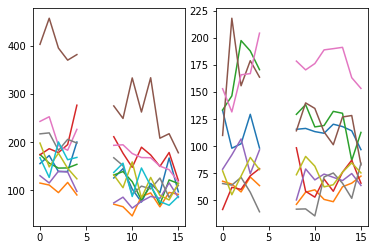

In [9]:
trial_idx = 1
plt.figure()
count = 0
plt.subplot(1,2,1)
for i in range(600):
    if u[0,i] == 1:
        plt.plot(y[trial_idx,:,i],)
        count += 1
    if count >= 10:
        break
count = 1
plt.subplot(1,2,2)
for i in range(600):
    if u[0,i] == 0:
        plt.plot(y[trial_idx,:,i])
        count += 1
    if count >= 10:
        break

Text(0, 0.5, 'delta_y')

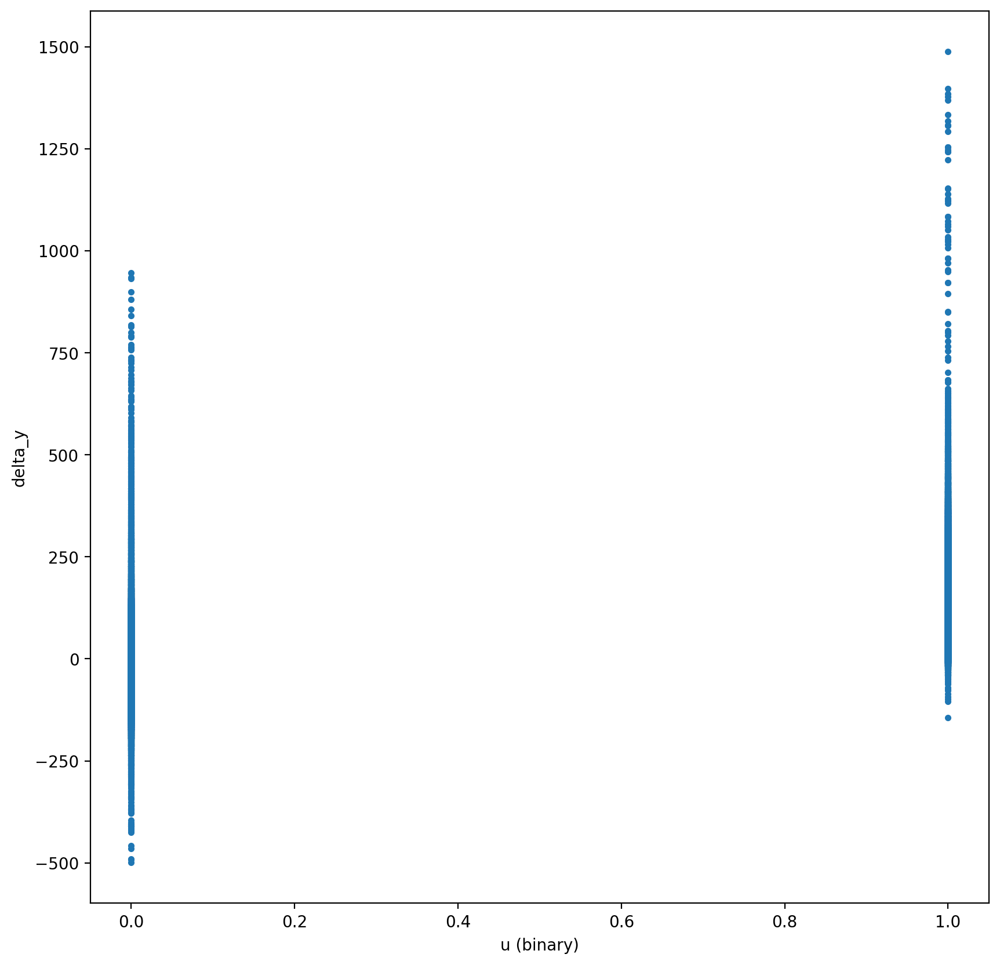

In [5]:
plt.figure(figsize=(10,10))
plt.plot(u.flatten(), (y_after-y_before).flatten(), '.')
plt.xlabel('u (binary)')
plt.ylabel('delta_y')

Text(0.5, 0, 'neuron_id')

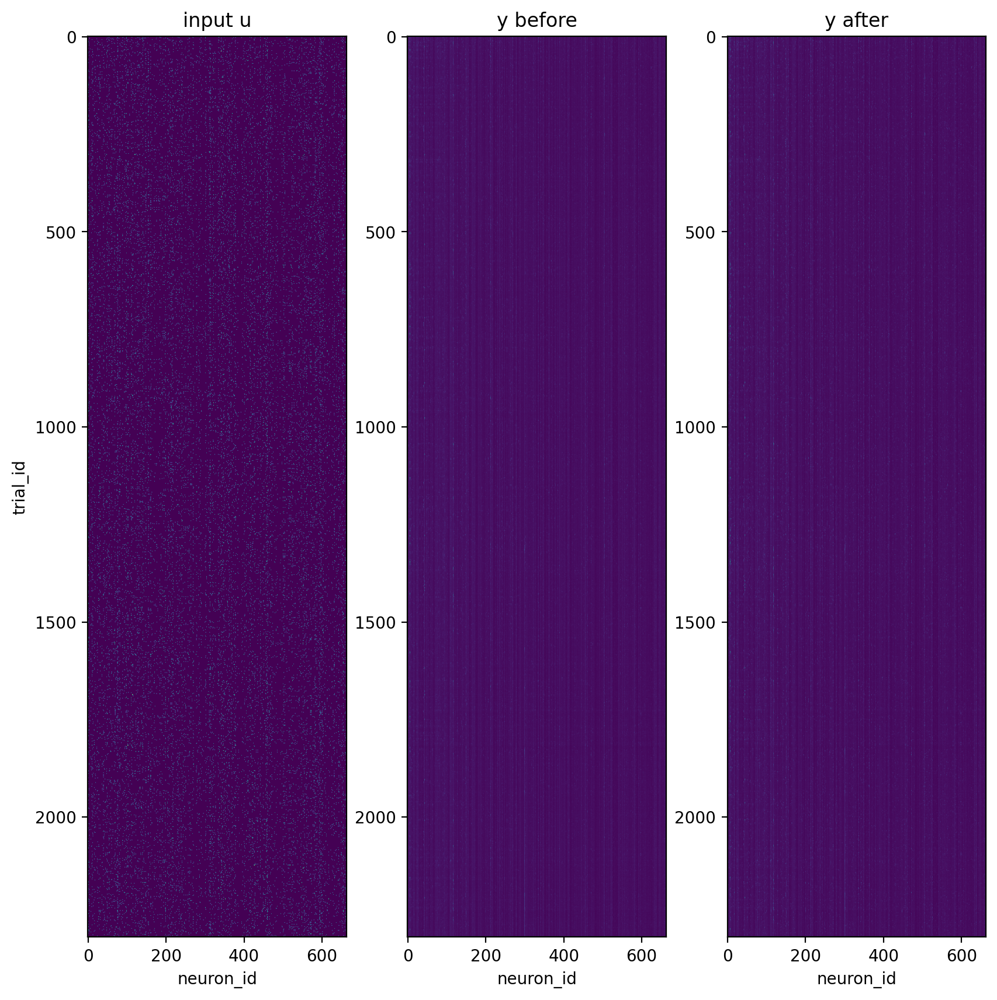

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(10,10))
axes[0].imshow(u)
axes[0].set_title('input u')
axes[0].set_xlabel('neuron_id')
axes[0].set_ylabel('trial_id')
axes[1].imshow(y_before)
axes[1].set_title('y before')
axes[1].set_xlabel('neuron_id')
axes[2].imshow(y_after)
axes[2].set_title('y after')
axes[2].set_xlabel('neuron_id')

In [8]:
fig, axes = plt.subplots(50, 4, figsize = (15,150))
for vis_neuron_id in range(100):
    untargeted_trial_ids = []
    a1 = int(vis_neuron_id%50)
    a2 = int(vis_neuron_id/50)
    target_trial_ids = np.where(u[:,vis_neuron_id] == 1)[0]
    y_target_mean = np.nanmean(y[target_trial_ids,:,vis_neuron_id], axis = 0)
    y_target_std = np.nanstd(y[target_trial_ids,:,vis_neuron_id], axis = 0)
    if len(y[target_trial_ids,:,vis_neuron_id]) != 0:
        vmax = np.nanmax(y[target_trial_ids,:,vis_neuron_id])
        vmin = np.nanmin(y[target_trial_ids,:,vis_neuron_id])
    untarget_trial_ids = np.where(u[:,vis_neuron_id] == 0)[0]
    y_untarget_mean = np.nanmean(y[untarget_trial_ids,:,vis_neuron_id], axis = 0)
    axes[a1][2*a2].plot(y_target_mean)
    axes[a1][2*a2].set_ylim([vmin, vmax])
    axes[a1][2*a2].fill_between(np.arange(0,y.shape[1]), 
                                y_target_mean-y_target_std, 
                                y_target_mean+y_target_std,
                                alpha=0.3)
    axes[a1][2*a2].plot(y_untarget_mean)
    axes[a1][2*a2+1].plot(y[target_trial_ids,:,vis_neuron_id].T)
    axes[a1][2*a2+1].set_ylim([vmin, vmax])

/tmp/ipykernel_10335/45759152.py:7: RuntimeWarning: Mean of empty slice
  y_target_mean = np.nanmean(y[target_trial_ids,:,vis_neuron_id], axis = 0)
/opt/conda/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_10335/45759152.py:13: RuntimeWarning: Mean of empty slice
  y_untarget_mean = np.nanmean(y[untarget_trial_ids,:,vis_neuron_id], axis = 0)
